In [52]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from skimage import data, color, io
from skimage.util import img_as_float
from scipy.ndimage import binary_dilation
import time
import warnings
from google.colab import files
np.random.seed(42)

### UNION-FIND DATA STRUCTURE


In [53]:
class UnionFind:
    def __init__(self, size):
        self.parent = np.arange(size, dtype=np.int32)
        self.rank = np.zeros(size, dtype=np.int32)
        self.size = np.ones(size, dtype=np.int32)
        self.internal_diff = np.zeros(size, dtype=np.float64) # this is specific to FSH algo
        print(f"UnionFind initialized with {size} elements")

    def find(self, x):
        x = int(x)
        if self.parent[x] != x:
            self.parent[x] = self.find(self.parent[x]) # path compression
        return int(self.parent[x])

    def union(self, x, y, edge_weight):
        rx = self.find(x)
        ry = self.find(y)
        if rx == ry:
            return False
        # union by rank
        if self.rank[rx] > self.rank[ry]:
            self.parent[ry] = rx
            self.size[rx] += self.size[ry]
            self.internal_diff[rx] = max(self.internal_diff[rx], self.internal_diff[ry], edge_weight)
        elif self.rank[rx] < self.rank[ry]:
            self.parent[rx] = ry
            self.size[ry] += self.size[rx]
            self.internal_diff[ry] = max(self.internal_diff[rx], self.internal_diff[ry], edge_weight)
        else:
            self.parent[ry] = rx
            self.rank[rx] += 1
            self.size[rx] += self.size[ry]
            self.internal_diff[rx] = max(self.internal_diff[rx], self.internal_diff[ry], edge_weight)
        return True

    def get_size(self, x):
        return int(self.size[self.find(x)])

    def get_internal_diff(self, x):
        return float(self.internal_diff[self.find(x)])

### UTILITY FUNCTIONS


In [54]:
def calculate_rgb_distance(img, p1, p2):
    # it is defined to the weight for the edges between nodes of a graph.
    r1, g1, b1 = img[p1[0], p1[1]]
    r2, g2, b2 = img[p2[0], p2[1]]
    return float(np.sqrt((r1 - r2) ** 2 + (g1 - g2) ** 2 + (b1 - b2) ** 2))


def build_graph(img):
    # N-8 neighbourhood for building graphs from images
    h, w = img.shape[:2]
    neighbors = [(0,1),(1,0),(1,1),(1,-1)]  # 8-connectivity subset
    edges = []
    for r in range(h):
        for c in range(w):
            idx = r * w + c
            for dr, dc in neighbors:
                nr, nc = r + dr, c + dc
                if 0 <= nr < h and 0 <= nc < w:
                    idx2 = nr * w + nc
                    wgt = calculate_rgb_distance(img, (r,c), (nr,nc))
                    edges.append((int(idx), int(idx2), float(wgt)))
    if len(edges) == 0:
        return np.zeros((0,3), dtype=np.float64)
    return np.array(edges, dtype=np.float64)


def _auto_correct_k(k, img):
    """If image values are in [0,1] and user passed a large k (e.g. 300), rescale and warn."""
    max_val = float(img.max())
    # if image in [0,1] but user set k > 10 (suggesting they used 0-255 scale), rescale
    if max_val <= 1.0 and k > 10.0:
        newk = k / 255.0
        warnings.warn(
            f"Image appears normalized to [0,1] (max={max_val}). Provided k={k} is large; "
            f"rescaling to {newk:.4f}. If you intended k for 0-255 images, pass scaled value."
        )
        return float(newk)
    return float(k)


## FELZENSZWALB-HUTTENLOCHER SEGMENTATION ALGORITHM


In [55]:

def felzenszwalb_segmentation(img, k=0.5, min_size=50, sigma=0.5, verbose=True):
    """
    img: float RGB image (H,W,3) -- if not, use img_as_float before calling.
    k: scale parameter (same scale as edge weights). Default tuned for [0,1] images.
    min_size: postprocessing minimum component size
    sigma: gaussian smoothing sigma (float)
    """
    if verbose:
        print("Felzenszwalb-Huttenlocher segmentation")
        print(f"Initial params: k={k}, min_size={min_size}, sigma={sigma}")

    # ensure float numeric image
    img = img.astype(np.float64)
    # auto-correct/rescale k if needed (common source of 1-segment bug)
    k = _auto_correct_k(k, img)

    # Step 1: smoothing each channel
    if sigma > 0:
        img_s = np.zeros_like(img, dtype=np.float64)
        for ch in range(3):
            img_s[..., ch] = gaussian_filter(img[..., ch], sigma=sigma)
    else:
        img_s = img.copy()

    h, w = img_s.shape[:2]
    n_pixels = h * w

    # Step 2: build graph
    edges = build_graph(img_s)
    if edges.shape[0] == 0:
        return np.zeros((h,w), dtype=np.int32), 0

    # Step 3: sort edges by weight
    order = np.argsort(edges[:, 2], kind='mergesort')
    edges = edges[order]

    # Step 4: union-find init
    uf = UnionFind(n_pixels)

    # Step 5: main loop
    def tau(size): return k / float(size) # this is or threshold
    merges = 0
    progress_step = max(1, len(edges)//10)
    for i in range(len(edges)):
        n1 = int(edges[i,0]); n2 = int(edges[i,1]); wgt = float(edges[i,2])
        if (i % progress_step == 0) and (i>0) and verbose:
            print(f" Progress: {i}/{len(edges)} ({100*i//len(edges)}%)")
        r1 = uf.find(n1); r2 = uf.find(n2)
        if r1 == r2:
            continue
        size1 = uf.get_size(r1); size2 = uf.get_size(r2)
        id1 = uf.get_internal_diff(r1); id2 = uf.get_internal_diff(r2)
        mint1 = id1 + tau(size1); mint2 = id2 + tau(size2)
        if wgt <= min(mint1, mint2):
            uf.union(r1, r2, wgt)
            merges += 1

    if verbose:
        print(f"Initial merges: {merges}")

    # Step 6: postprocess small components
    small_merges = 0
    for i in range(len(edges)):
        n1 = int(edges[i,0]); n2 = int(edges[i,1]); wgt = float(edges[i,2])
        r1 = uf.find(n1); r2 = uf.find(n2)
        if r1 != r2:
            if (uf.get_size(r1) < min_size) or (uf.get_size(r2) < min_size):
                uf.union(r1, r2, wgt)
                small_merges += 1
    if verbose:
        print(f"small-component merges: {small_merges}")

    # Step 7: label map
    labels_flat = np.zeros(n_pixels, dtype=np.int32)
    for i in range(n_pixels):
        labels_flat[i] = uf.find(i)
    unique, relabeled = np.unique(labels_flat, return_inverse=True)
    labels = relabeled.reshape((h,w)).astype(np.int32)
    num_segments = unique.size

    if verbose:
        print(f"Segmentation complete: {num_segments} segments")
    return labels, int(num_segments)

### IMAGE LOADING FUNCTIONS


In [56]:

def load_image_from_upload():
    """
    Load image from user upload in Google Colab.

    Returns:
    --------
    numpy.ndarray : Image in RGB format, float [0, 1]
    """
    print("\n Please upload an image file...")
    uploaded = files.upload()

    if len(uploaded) == 0:
        raise ValueError("No file uploaded")

    filename = list(uploaded.keys())[0]
    img = io.imread(filename)

    # Convert to RGB if needed
    if img.ndim == 2:  # Grayscale
        img = color.gray2rgb(img)
    elif img.shape[2] == 4:  # RGBA
        img = color.rgba2rgb(img)

    # Convert to float [0, 1]
    img = img_as_float(img)

    print(f"Image loaded from upload: {filename}")
    print(f"Shape: {img.shape}, dtype: {img.dtype}")

    return img


def load_image_from_sample(image_name='astronaut'):
    """
    Load a sample image from skimage.data.

    Parameters:
    -----------
    image_name : str
        Name of sample image: 'astronaut', 'camera', 'horse', 'coffee', etc.

    Returns:
    --------
    numpy.ndarray : Image in RGB format, float [0, 1]
    """
    from skimage import data

    # Map image names to functions
    sample_images = {
        'astronaut': data.astronaut,
        'camera': data.camera,
        'horse': data.horse,
        'coffee': data.coffee,
        'coins': data.coins,
        'rocket': data.rocket,
        'cat': data.chelsea,
    }

    if image_name not in sample_images:
        print(f"Unknown image: {image_name}")
        print(f"Available: {list(sample_images.keys())}")
        image_name = 'astronaut'
        print(f"Using default: {image_name}")

    img = sample_images[image_name]()

    # Convert to RGB if grayscale
    if img.ndim == 2:
        img = color.gray2rgb(img)

    # Convert to float [0, 1]
    img = img_as_float(img)

    print(f"Sample image loaded: {image_name}")
    print(f"   Shape: {img.shape}, dtype: {img.dtype}")

    return img


def load_image_from_url(url):
    """
    Load image from a URL.

    Parameters:
    -----------
    url : str
        Image URL

    Returns:
    --------
    numpy.ndarray : Image in RGB format, float [0, 1]
    """
    print(f"\n Downloading image from URL...")

    try:
        response = requests.get(url, timeout=10)
        response.raise_for_status()
        img = io.imread(BytesIO(response.content))

        # Convert to RGB if needed
        if img.ndim == 2:
            img = color.gray2rgb(img)
        elif img.shape[2] == 4:
            img = color.rgba2rgb(img)

        # Convert to float [0, 1]
        img = img_as_float(img)

        print(f"Image loaded from URL")
        print(f"   Shape: {img.shape}, dtype: {img.dtype}")

        return img

    except Exception as e:
        print(f"Error loading image from URL: {e}")
        raise


def load_image(source='sample', image_name='astronaut', url=None):
    """
    Dynamic image loading function that handles multiple input types.

    Parameters:
    -----------
    source : str
        'upload', 'sample', or 'url'
    image_name : str
        Name of sample image (if source='sample')
    url : str
        Image URL (if source='url')

    Returns:
    --------
    numpy.ndarray : Image in RGB format, float [0, 1]
    """
    if source == 'upload':
        return load_image_from_upload()
    elif source == 'sample':
        return load_image_from_sample(image_name)
    elif source == 'url':
        if url is None:
            raise ValueError("URL must be provided when source='url'")
        return load_image_from_url(url)
    else:
        raise ValueError(f"Unknown source: {source}. Use 'upload', 'sample', or 'url'")

### VISUALIZATION FUNCTIONS


In [57]:
from matplotlib.colors import hsv_to_rgb
import matplotlib.pyplot as plt


def visualize_segmentation(img, labels, title=None):
    h,w = labels.shape
    unique = np.unique(labels)
    num = len(unique)

    fig, axs = plt.subplots(1, 2, figsize=(12, 6))

    # Original image
    axs[0].imshow(img)
    axs[0].set_title("Original")
    axs[0].axis('off')

    # Segmented image using color map
    axs[1].imshow(labels, cmap='tab20')
    axs[1].set_title(f"Segments ({num})")
    axs[1].axis('off')

    if title:
        plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

def compare_parameters(img, param_sets):
    print("PARAMETER COMPARISON")
    for i, params in enumerate(param_sets):
        print(f"\n[{i+1}/{len(param_sets)}] Testing: {params}")
        labels, num_seg = felzenszwalb_segmentation(img, **params)
        visualize_segmentation(img, labels, title=f"k={params['k']}, sigma={params['sigma']}, min_size={params['min_size']} ({num_seg} segments)")
    print("\n Comparison complete!")

### EXAMPLE 1: Sample Image - Astronaut


EXAMPLE 1: Astronaut Image
Sample image loaded: astronaut
   Shape: (512, 512, 3), dtype: float64


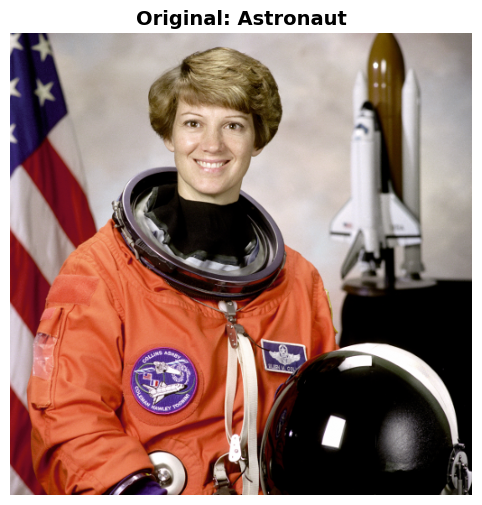

Felzenszwalb-Huttenlocher segmentation
Initial params: k=300, min_size=50, sigma=0.8


/tmp/ipython-input-3885346643.py:33: UserWarning: Image appears normalized to [0,1] (max=1.0). Provided k=300 is large; rescaling to 1.1765. If you intended k for 0-255 images, pass scaled value.
  warnings.warn(


UnionFind initialized with 262144 elements
 Progress: 104550/1045506 (9%)
 Progress: 209100/1045506 (19%)
 Progress: 313650/1045506 (29%)
 Progress: 418200/1045506 (39%)
 Progress: 522750/1045506 (49%)
 Progress: 627300/1045506 (59%)
 Progress: 731850/1045506 (69%)
 Progress: 836400/1045506 (79%)
 Progress: 940950/1045506 (89%)
 Progress: 1045500/1045506 (99%)
Initial merges: 261170
small-component merges: 724
Segmentation complete: 250 segments


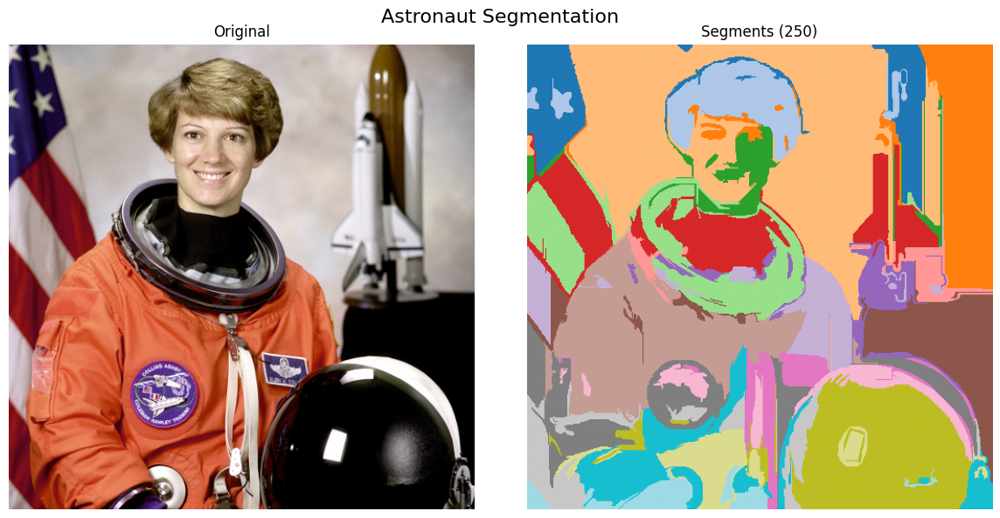

In [58]:
print("EXAMPLE 1: Astronaut Image")

img1 = load_image_from_sample('astronaut')

plt.figure(figsize=(8, 6))
plt.imshow(img1)
plt.title("Original: Astronaut", fontsize=14, fontweight='bold')
plt.axis('off')
plt.show()

labels1, num_seg1 = felzenszwalb_segmentation(img1, k=300, min_size=50, sigma=0.8)
visualize_segmentation(img1, labels1, "Astronaut Segmentation")

### EXAMPLE 2: Parameter Comparison - Coffee Image


EXAMPLE 2: Coffee Image - Parameter Comparison
Sample image loaded: coffee
   Shape: (400, 600, 3), dtype: float64


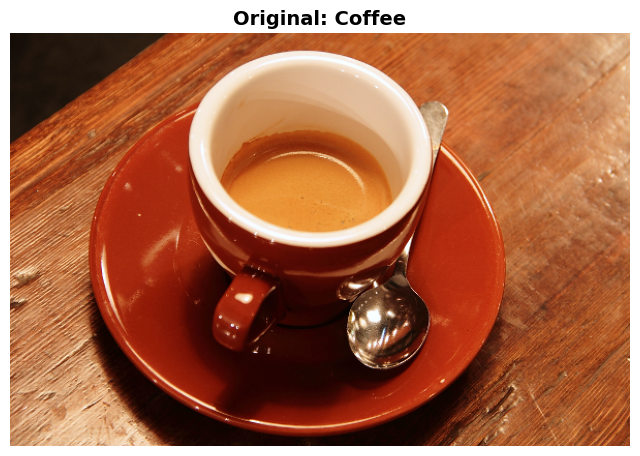

PARAMETER COMPARISON

[1/3] Testing: {'k': 150, 'min_size': 30, 'sigma': 0.5}
Felzenszwalb-Huttenlocher segmentation
Initial params: k=150, min_size=30, sigma=0.5


/tmp/ipython-input-3885346643.py:33: UserWarning: Image appears normalized to [0,1] (max=1.0). Provided k=150 is large; rescaling to 0.5882. If you intended k for 0-255 images, pass scaled value.
  warnings.warn(


UnionFind initialized with 240000 elements
 Progress: 95700/957002 (9%)
 Progress: 191400/957002 (19%)
 Progress: 287100/957002 (29%)
 Progress: 382800/957002 (39%)
 Progress: 478500/957002 (49%)
 Progress: 574200/957002 (59%)
 Progress: 669900/957002 (69%)
 Progress: 765600/957002 (79%)
 Progress: 861300/957002 (89%)
 Progress: 957000/957002 (99%)
Initial merges: 236400
small-component merges: 3175
Segmentation complete: 425 segments


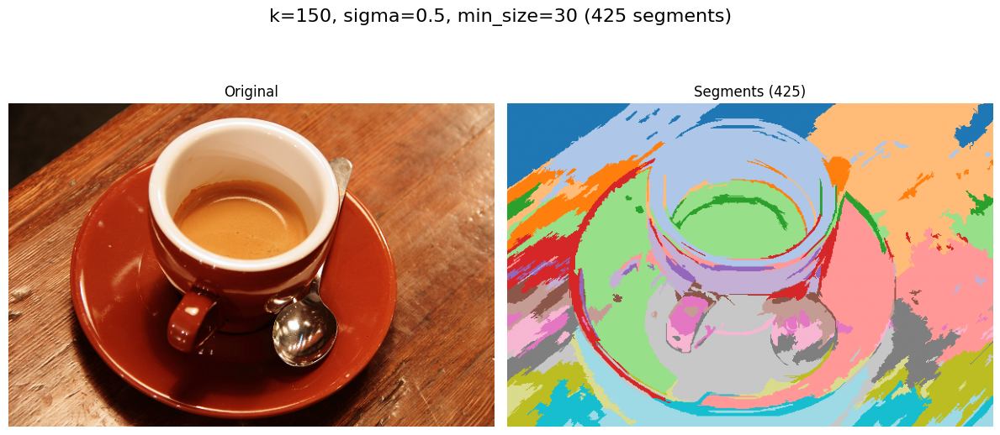


[2/3] Testing: {'k': 300, 'min_size': 50, 'sigma': 0.8}
Felzenszwalb-Huttenlocher segmentation
Initial params: k=300, min_size=50, sigma=0.8


/tmp/ipython-input-3885346643.py:33: UserWarning: Image appears normalized to [0,1] (max=1.0). Provided k=300 is large; rescaling to 1.1765. If you intended k for 0-255 images, pass scaled value.
  warnings.warn(


UnionFind initialized with 240000 elements
 Progress: 95700/957002 (9%)
 Progress: 191400/957002 (19%)
 Progress: 287100/957002 (29%)
 Progress: 382800/957002 (39%)
 Progress: 478500/957002 (49%)
 Progress: 574200/957002 (59%)
 Progress: 669900/957002 (69%)
 Progress: 765600/957002 (79%)
 Progress: 861300/957002 (89%)
 Progress: 957000/957002 (99%)
Initial merges: 238795
small-component merges: 1055
Segmentation complete: 150 segments


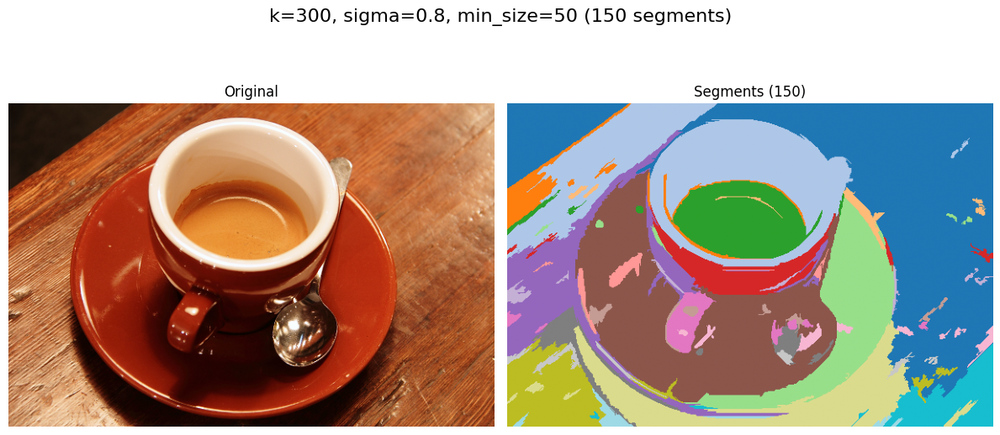


[3/3] Testing: {'k': 600, 'min_size': 100, 'sigma': 1.0}
Felzenszwalb-Huttenlocher segmentation
Initial params: k=600, min_size=100, sigma=1.0


/tmp/ipython-input-3885346643.py:33: UserWarning: Image appears normalized to [0,1] (max=1.0). Provided k=600 is large; rescaling to 2.3529. If you intended k for 0-255 images, pass scaled value.
  warnings.warn(


UnionFind initialized with 240000 elements
 Progress: 95700/957002 (9%)
 Progress: 191400/957002 (19%)
 Progress: 287100/957002 (29%)
 Progress: 382800/957002 (39%)
 Progress: 478500/957002 (49%)
 Progress: 574200/957002 (59%)
 Progress: 669900/957002 (69%)
 Progress: 765600/957002 (79%)
 Progress: 861300/957002 (89%)
 Progress: 957000/957002 (99%)
Initial merges: 239427
small-component merges: 524
Segmentation complete: 49 segments


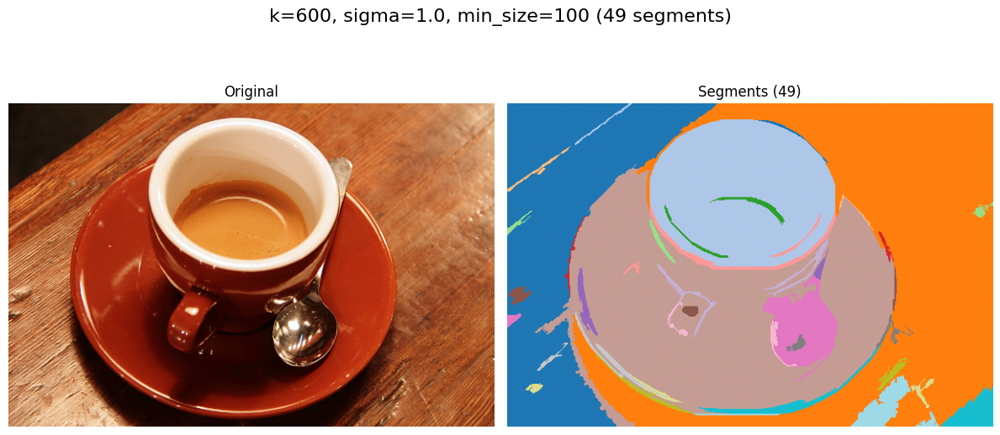


 Comparison complete!


In [59]:
print("EXAMPLE 2: Coffee Image - Parameter Comparison")

img2 = load_image_from_sample('coffee')

plt.figure(figsize=(8, 6))
plt.imshow(img2)
plt.title("Original: Coffee", fontsize=14, fontweight='bold')
plt.axis('off')
plt.show()

param_sets = [
    {'k': 150, 'min_size': 30, 'sigma': 0.5},
    {'k': 300, 'min_size': 50, 'sigma': 0.8},
    {'k': 600, 'min_size': 100, 'sigma': 1.0},
]

compare_parameters(img2, param_sets)


### EXAMPLE 3: EFFECT OF SCALE PARAMETER k


EXAMPLE 3: Cat Image - Effect of k Parameter
Sample image loaded: cat
   Shape: (300, 451, 3), dtype: float64


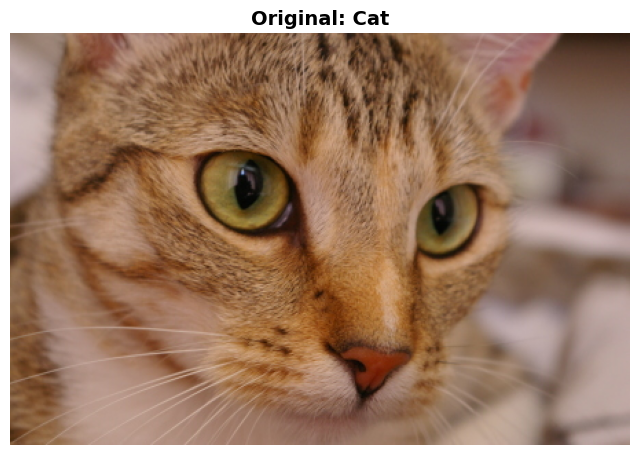

PARAMETER COMPARISON

[1/3] Testing: {'k': 200, 'min_size': 50, 'sigma': 0.8}
Felzenszwalb-Huttenlocher segmentation
Initial params: k=200, min_size=50, sigma=0.8


/tmp/ipython-input-3885346643.py:33: UserWarning: Image appears normalized to [0,1] (max=0.9058823529411765). Provided k=200 is large; rescaling to 0.7843. If you intended k for 0-255 images, pass scaled value.
  warnings.warn(


UnionFind initialized with 135300 elements
 Progress: 53894/538949 (9%)
 Progress: 107788/538949 (19%)
 Progress: 161682/538949 (29%)
 Progress: 215576/538949 (39%)
 Progress: 269470/538949 (49%)
 Progress: 323364/538949 (59%)
 Progress: 377258/538949 (69%)
 Progress: 431152/538949 (79%)
 Progress: 485046/538949 (89%)
 Progress: 538940/538949 (99%)
Initial merges: 134550
small-component merges: 657
Segmentation complete: 93 segments


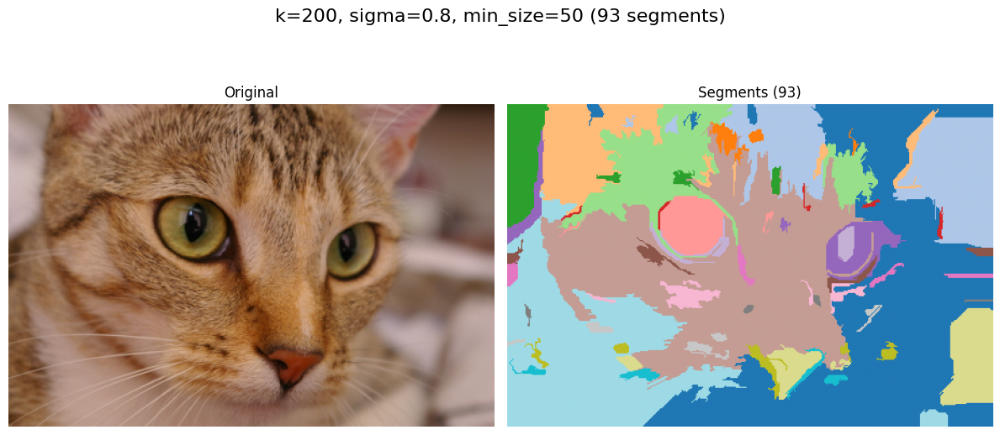


[2/3] Testing: {'k': 400, 'min_size': 50, 'sigma': 0.8}
Felzenszwalb-Huttenlocher segmentation
Initial params: k=400, min_size=50, sigma=0.8


/tmp/ipython-input-3885346643.py:33: UserWarning: Image appears normalized to [0,1] (max=0.9058823529411765). Provided k=400 is large; rescaling to 1.5686. If you intended k for 0-255 images, pass scaled value.
  warnings.warn(


UnionFind initialized with 135300 elements
 Progress: 53894/538949 (9%)
 Progress: 107788/538949 (19%)
 Progress: 161682/538949 (29%)
 Progress: 215576/538949 (39%)
 Progress: 269470/538949 (49%)
 Progress: 323364/538949 (59%)
 Progress: 377258/538949 (69%)
 Progress: 431152/538949 (79%)
 Progress: 485046/538949 (89%)
 Progress: 538940/538949 (99%)
Initial merges: 134776
small-component merges: 476
Segmentation complete: 48 segments


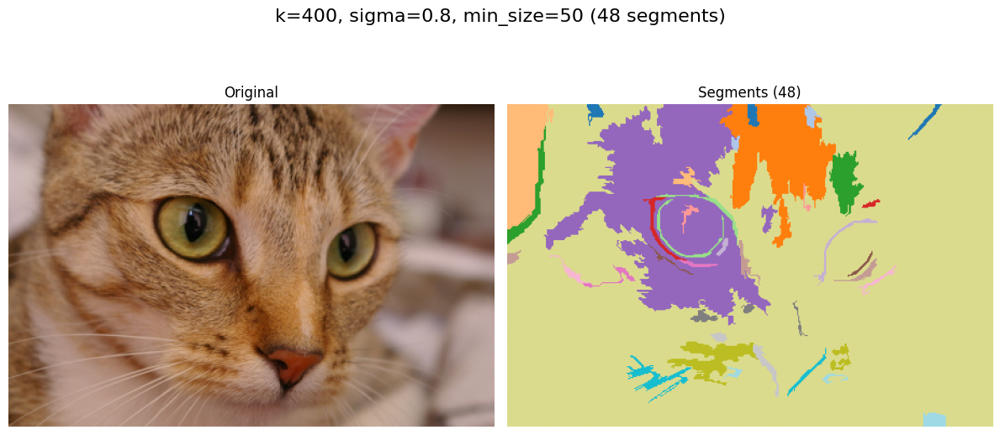


[3/3] Testing: {'k': 800, 'min_size': 50, 'sigma': 0.8}
Felzenszwalb-Huttenlocher segmentation
Initial params: k=800, min_size=50, sigma=0.8


/tmp/ipython-input-3885346643.py:33: UserWarning: Image appears normalized to [0,1] (max=0.9058823529411765). Provided k=800 is large; rescaling to 3.1373. If you intended k for 0-255 images, pass scaled value.
  warnings.warn(


UnionFind initialized with 135300 elements
 Progress: 53894/538949 (9%)
 Progress: 107788/538949 (19%)
 Progress: 161682/538949 (29%)
 Progress: 215576/538949 (39%)
 Progress: 269470/538949 (49%)
 Progress: 323364/538949 (59%)
 Progress: 377258/538949 (69%)
 Progress: 431152/538949 (79%)
 Progress: 485046/538949 (89%)
 Progress: 538940/538949 (99%)
Initial merges: 134814
small-component merges: 452
Segmentation complete: 34 segments


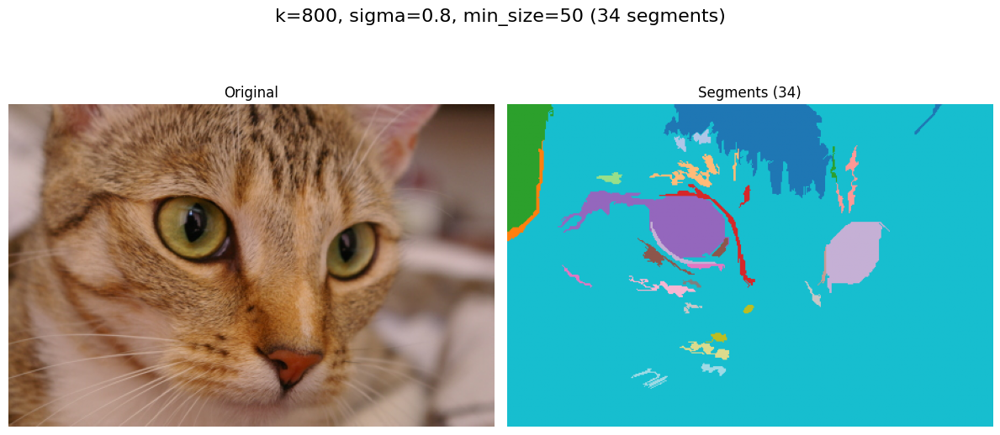


 Comparison complete!


In [62]:
print("EXAMPLE 3: Cat Image - Effect of k Parameter")

img3 = load_image_from_sample('cat')

plt.figure(figsize=(8, 6))
plt.imshow(img3)
plt.title("Original: Cat", fontsize=14, fontweight='bold')
plt.axis('off')
plt.show()

param_sets_k = [
    {'k': 200, 'min_size': 50, 'sigma': 0.8},
    {'k': 400, 'min_size': 50, 'sigma': 0.8},
    {'k': 800, 'min_size': 50, 'sigma': 0.8},
]

compare_parameters(img3, param_sets_k)

### EXAMPLE 4: EFFECT OF MINIMUM SIZE PARAMETER


EXAMPLE 4: EFFECT OF MINIMUM SIZE PARAMETER
Sample image loaded: horse
   Shape: (328, 400, 3), dtype: float64


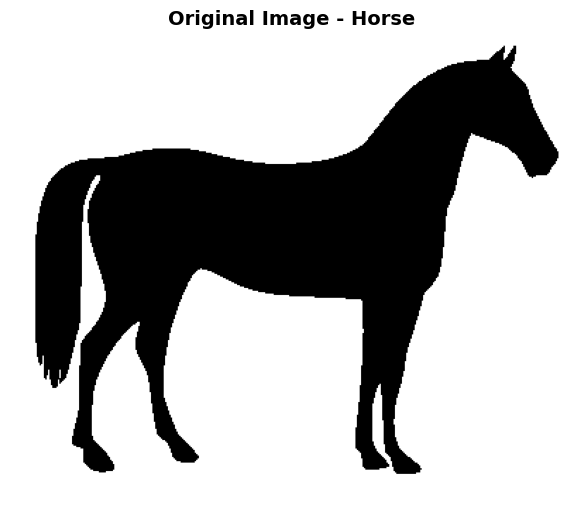


📊 Analyzing effect of min_size parameter...
PARAMETER COMPARISON

[1/3] Testing: {'k': 300, 'min_size': 10, 'sigma': 0.8}
Felzenszwalb-Huttenlocher segmentation
Initial params: k=300, min_size=10, sigma=0.8


/tmp/ipython-input-3885346643.py:33: UserWarning: Image appears normalized to [0,1] (max=1.0). Provided k=300 is large; rescaling to 1.1765. If you intended k for 0-255 images, pass scaled value.
  warnings.warn(


UnionFind initialized with 131200 elements
 Progress: 52261/522618 (9%)
 Progress: 104522/522618 (19%)
 Progress: 156783/522618 (29%)
 Progress: 209044/522618 (39%)
 Progress: 261305/522618 (49%)
 Progress: 313566/522618 (59%)
 Progress: 365827/522618 (69%)
 Progress: 418088/522618 (79%)
 Progress: 470349/522618 (89%)
 Progress: 522610/522618 (99%)
Initial merges: 130920
small-component merges: 83
Segmentation complete: 197 segments


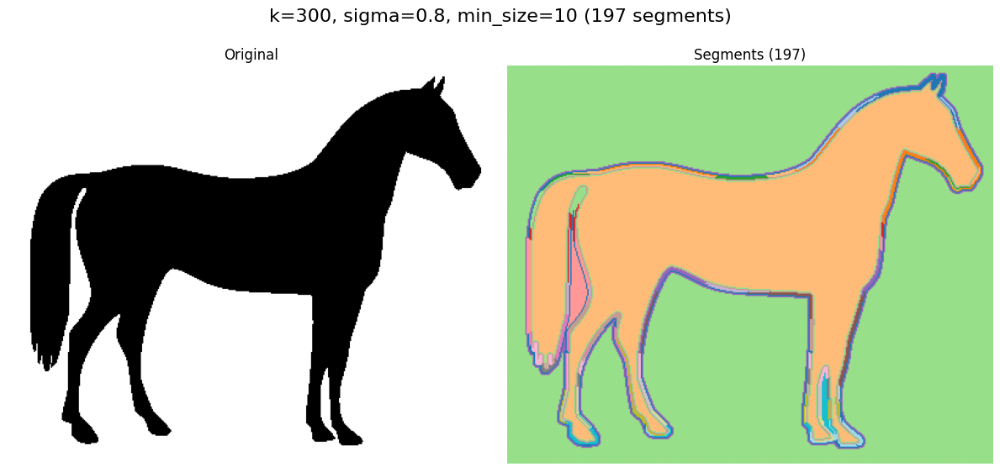


[2/3] Testing: {'k': 300, 'min_size': 50, 'sigma': 0.8}
Felzenszwalb-Huttenlocher segmentation
Initial params: k=300, min_size=50, sigma=0.8
UnionFind initialized with 131200 elements
 Progress: 52261/522618 (9%)
 Progress: 104522/522618 (19%)
 Progress: 156783/522618 (29%)
 Progress: 209044/522618 (39%)
 Progress: 261305/522618 (49%)
 Progress: 313566/522618 (59%)
 Progress: 365827/522618 (69%)
 Progress: 418088/522618 (79%)
 Progress: 470349/522618 (89%)
 Progress: 522610/522618 (99%)
Initial merges: 130920
small-component merges: 245
Segmentation complete: 35 segments


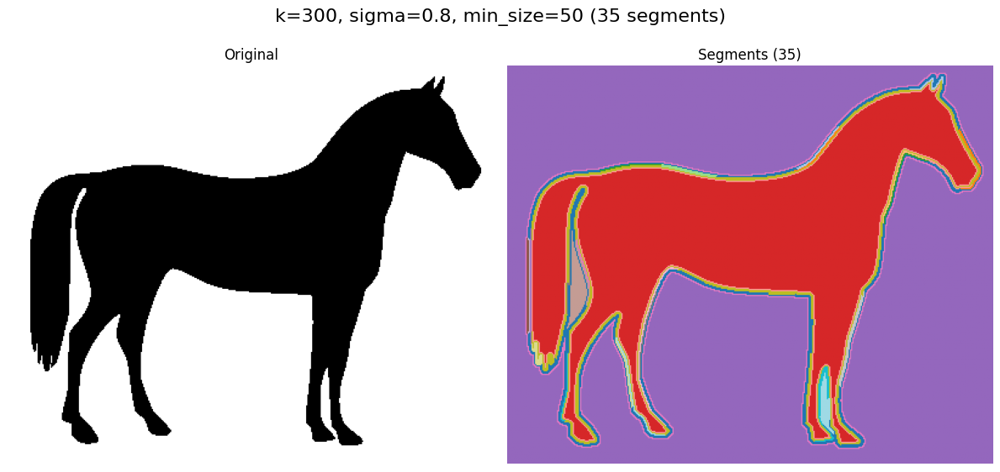


[3/3] Testing: {'k': 300, 'min_size': 100, 'sigma': 0.8}
Felzenszwalb-Huttenlocher segmentation
Initial params: k=300, min_size=100, sigma=0.8
UnionFind initialized with 131200 elements
 Progress: 52261/522618 (9%)
 Progress: 104522/522618 (19%)
 Progress: 156783/522618 (29%)
 Progress: 209044/522618 (39%)
 Progress: 261305/522618 (49%)
 Progress: 313566/522618 (59%)
 Progress: 365827/522618 (69%)
 Progress: 418088/522618 (79%)
 Progress: 470349/522618 (89%)
 Progress: 522610/522618 (99%)
Initial merges: 130920
small-component merges: 267
Segmentation complete: 13 segments


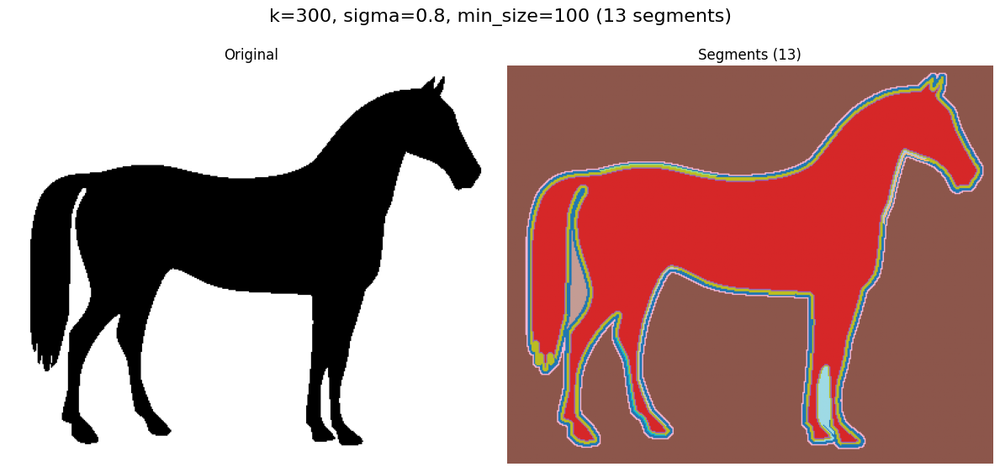


 Comparison complete!


In [63]:
print("EXAMPLE 4: EFFECT OF MINIMUM SIZE PARAMETER")

# Load horse image
img4 = load_image_from_sample(image_name='horse')

# Display original
plt.figure(figsize=(8, 6))
plt.imshow(img4)
plt.title("Original Image - Horse", fontsize=14, fontweight='bold')
plt.axis('off')
plt.show()

# Test different min_size values
param_sets_minsize = [
    {'k': 300, 'min_size': 10, 'sigma': 0.8},
    {'k': 300, 'min_size': 50, 'sigma': 0.8},
    {'k': 300, 'min_size': 100, 'sigma': 0.8},
]

print("\n📊 Analyzing effect of min_size parameter...")
compare_parameters(img4, param_sets_minsize)

### EXAMPLE 5: EFFECT OF GAUSSIAN SMOOTHING (sigma)


EXAMPLE 5: EFFECT OF GAUSSIAN SMOOTHING (sigma)
Sample image loaded: rocket
   Shape: (427, 640, 3), dtype: float64


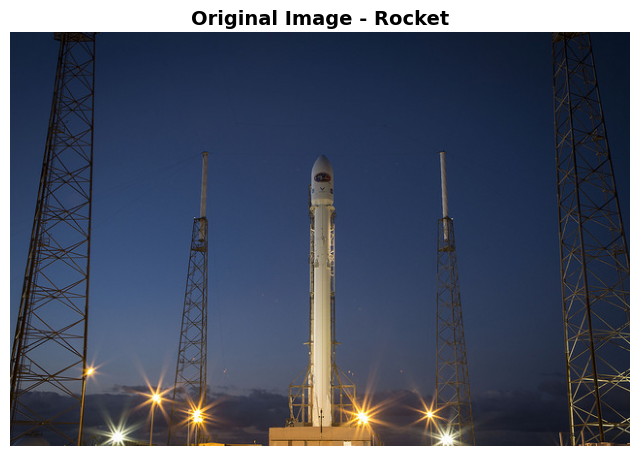


 Analyzing effect of sigma parameter...
PARAMETER COMPARISON

[1/3] Testing: {'k': 300, 'min_size': 50, 'sigma': 0.0}
Felzenszwalb-Huttenlocher segmentation
Initial params: k=300, min_size=50, sigma=0.0


/tmp/ipython-input-3885346643.py:33: UserWarning: Image appears normalized to [0,1] (max=1.0). Provided k=300 is large; rescaling to 1.1765. If you intended k for 0-255 images, pass scaled value.
  warnings.warn(


UnionFind initialized with 273280 elements
 Progress: 108992/1089921 (9%)
 Progress: 217984/1089921 (19%)
 Progress: 326976/1089921 (29%)
 Progress: 435968/1089921 (39%)
 Progress: 544960/1089921 (49%)
 Progress: 653952/1089921 (59%)
 Progress: 762944/1089921 (69%)
 Progress: 871936/1089921 (79%)
 Progress: 980928/1089921 (89%)
 Progress: 1089920/1089921 (99%)
Initial merges: 269708
small-component merges: 3149
Segmentation complete: 423 segments


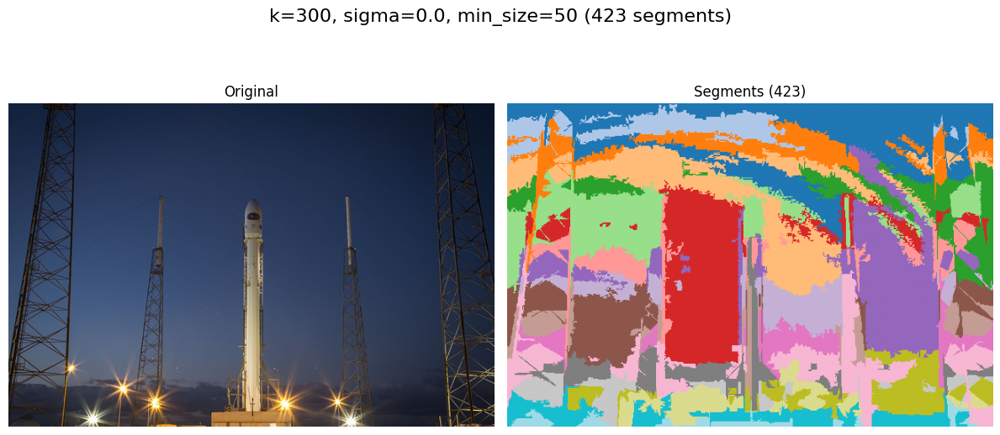


[2/3] Testing: {'k': 300, 'min_size': 50, 'sigma': 0.5}
Felzenszwalb-Huttenlocher segmentation
Initial params: k=300, min_size=50, sigma=0.5
UnionFind initialized with 273280 elements
 Progress: 108992/1089921 (9%)
 Progress: 217984/1089921 (19%)
 Progress: 326976/1089921 (29%)
 Progress: 435968/1089921 (39%)
 Progress: 544960/1089921 (49%)
 Progress: 653952/1089921 (59%)
 Progress: 762944/1089921 (69%)
 Progress: 871936/1089921 (79%)
 Progress: 980928/1089921 (89%)
 Progress: 1089920/1089921 (99%)
Initial merges: 271870
small-component merges: 1198
Segmentation complete: 212 segments


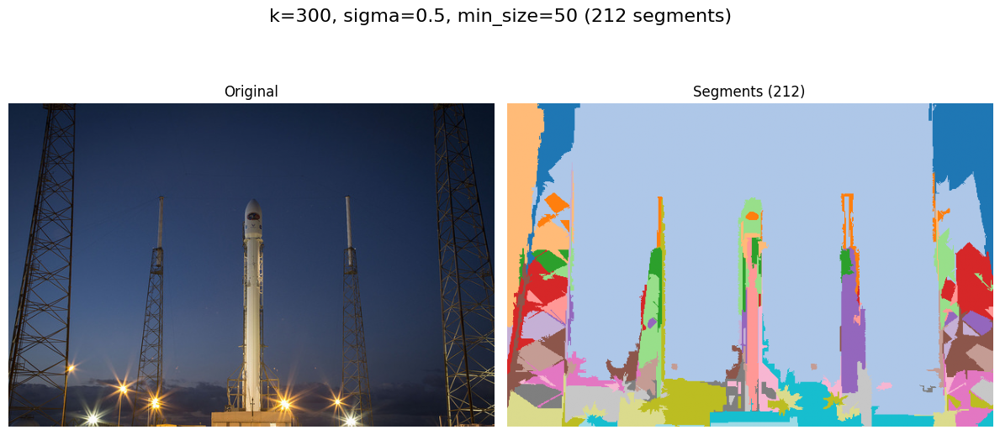


[3/3] Testing: {'k': 300, 'min_size': 50, 'sigma': 1.2}
Felzenszwalb-Huttenlocher segmentation
Initial params: k=300, min_size=50, sigma=1.2
UnionFind initialized with 273280 elements
 Progress: 108992/1089921 (9%)
 Progress: 217984/1089921 (19%)
 Progress: 326976/1089921 (29%)
 Progress: 435968/1089921 (39%)
 Progress: 544960/1089921 (49%)
 Progress: 653952/1089921 (59%)
 Progress: 762944/1089921 (69%)
 Progress: 871936/1089921 (79%)
 Progress: 980928/1089921 (89%)
 Progress: 1089920/1089921 (99%)
Initial merges: 272811
small-component merges: 392
Segmentation complete: 77 segments


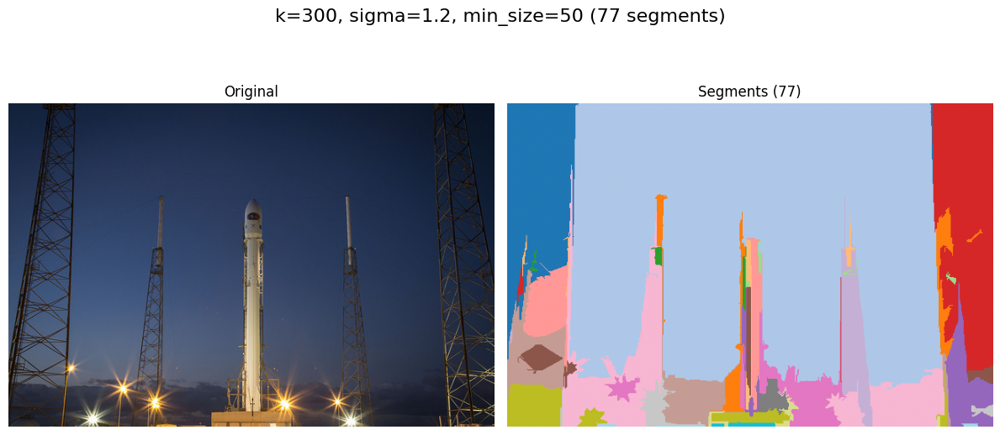


 Comparison complete!


In [64]:
print("EXAMPLE 5: EFFECT OF GAUSSIAN SMOOTHING (sigma)")

# Use rocket image
img5 = load_image_from_sample(image_name='rocket')

# Display original
plt.figure(figsize=(8, 6))
plt.imshow(img5)
plt.title("Original Image - Rocket", fontsize=14, fontweight='bold')
plt.axis('off')
plt.show()

# Test different sigma values
param_sets_sigma = [
    {'k': 300, 'min_size': 50, 'sigma': 0.0},   # No smoothing
    {'k': 300, 'min_size': 50, 'sigma': 0.5},   # Light smoothing
    {'k': 300, 'min_size': 50, 'sigma': 1.2},   # Heavy smoothing
]

print("\n Analyzing effect of sigma parameter...")
compare_parameters(img5, param_sets_sigma)

### EXAMPLE 6: UPLOAD YOUR OWN IMAGE

EXAMPLE 6: UPLOAD YOUR OWN IMAGE

 Please upload an image file...


Saving test 4.jpg to test 4 (2).jpg
Image loaded from upload: test 4 (2).jpg
Shape: (1280, 989, 3), dtype: float64


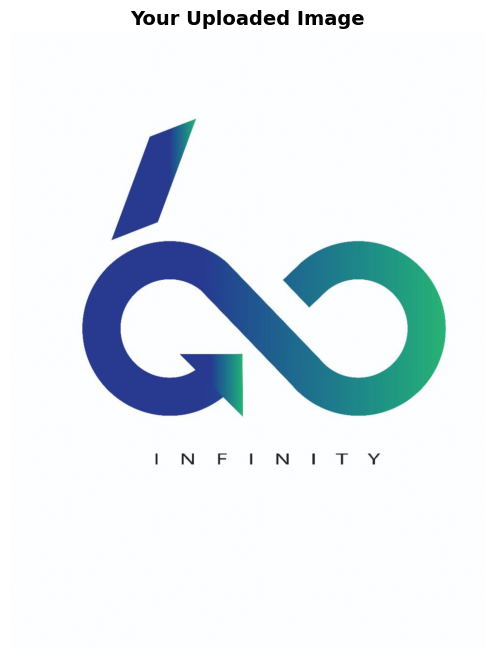

Felzenszwalb-Huttenlocher segmentation
Initial params: k=300, min_size=50, sigma=0.8


/tmp/ipython-input-3885346643.py:33: UserWarning: Image appears normalized to [0,1] (max=1.0). Provided k=300 is large; rescaling to 1.1765. If you intended k for 0-255 images, pass scaled value.
  warnings.warn(


UnionFind initialized with 1265920 elements
 Progress: 505687/5056875 (9%)
 Progress: 1011374/5056875 (19%)
 Progress: 1517061/5056875 (29%)
 Progress: 2022748/5056875 (39%)
 Progress: 2528435/5056875 (49%)
 Progress: 3034122/5056875 (59%)
 Progress: 3539809/5056875 (69%)
 Progress: 4045496/5056875 (79%)
 Progress: 4551183/5056875 (89%)
 Progress: 5056870/5056875 (99%)
Initial merges: 1265347
small-component merges: 426
Segmentation complete: 147 segments


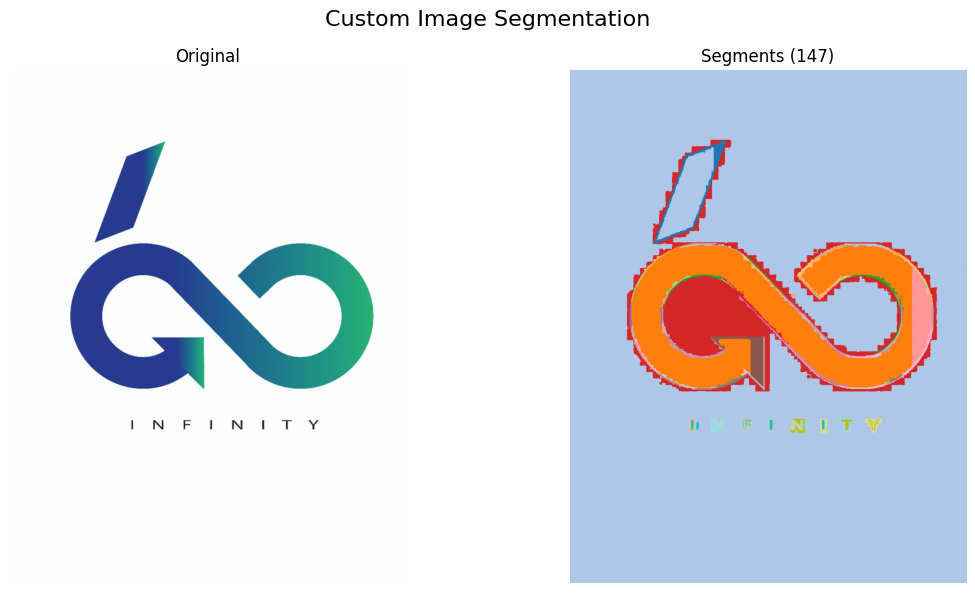

PARAMETER COMPARISON

[1/3] Testing: {'k': 200, 'min_size': 30, 'sigma': 0.5}
Felzenszwalb-Huttenlocher segmentation
Initial params: k=200, min_size=30, sigma=0.5


/tmp/ipython-input-3885346643.py:33: UserWarning: Image appears normalized to [0,1] (max=1.0). Provided k=200 is large; rescaling to 0.7843. If you intended k for 0-255 images, pass scaled value.
  warnings.warn(


UnionFind initialized with 1265920 elements
 Progress: 505687/5056875 (9%)
 Progress: 1011374/5056875 (19%)
 Progress: 1517061/5056875 (29%)
 Progress: 2022748/5056875 (39%)
 Progress: 2528435/5056875 (49%)
 Progress: 3034122/5056875 (59%)
 Progress: 3539809/5056875 (69%)
 Progress: 4045496/5056875 (79%)
 Progress: 4551183/5056875 (89%)
 Progress: 5056870/5056875 (99%)
Initial merges: 1264552
small-component merges: 1022
Segmentation complete: 346 segments


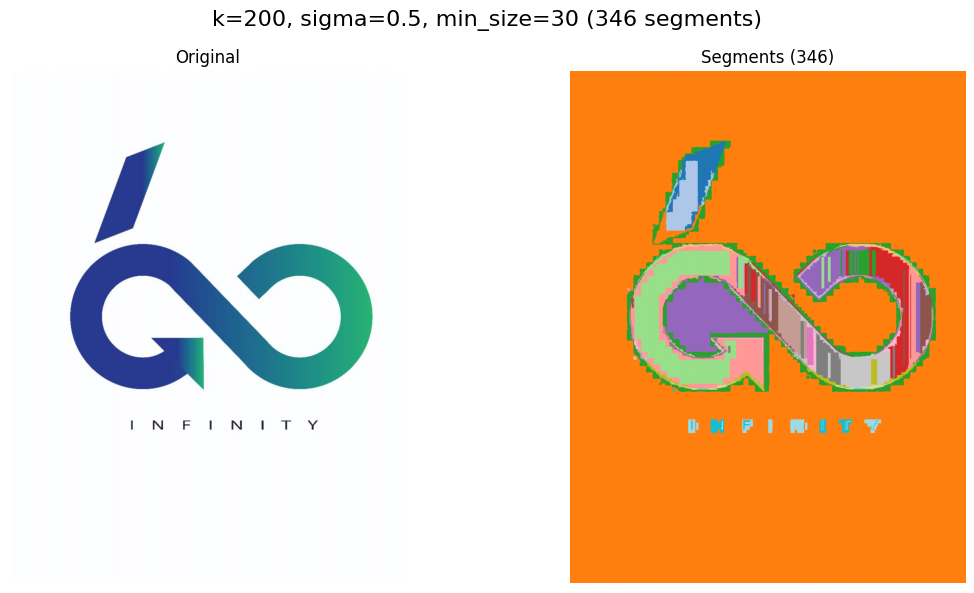


[2/3] Testing: {'k': 400, 'min_size': 60, 'sigma': 0.8}
Felzenszwalb-Huttenlocher segmentation
Initial params: k=400, min_size=60, sigma=0.8


/tmp/ipython-input-3885346643.py:33: UserWarning: Image appears normalized to [0,1] (max=1.0). Provided k=400 is large; rescaling to 1.5686. If you intended k for 0-255 images, pass scaled value.
  warnings.warn(


UnionFind initialized with 1265920 elements
 Progress: 505687/5056875 (9%)
 Progress: 1011374/5056875 (19%)
 Progress: 1517061/5056875 (29%)
 Progress: 2022748/5056875 (39%)
 Progress: 2528435/5056875 (49%)
 Progress: 3034122/5056875 (59%)
 Progress: 3539809/5056875 (69%)
 Progress: 4045496/5056875 (79%)
 Progress: 4551183/5056875 (89%)
 Progress: 5056870/5056875 (99%)
Initial merges: 1265439
small-component merges: 375
Segmentation complete: 106 segments


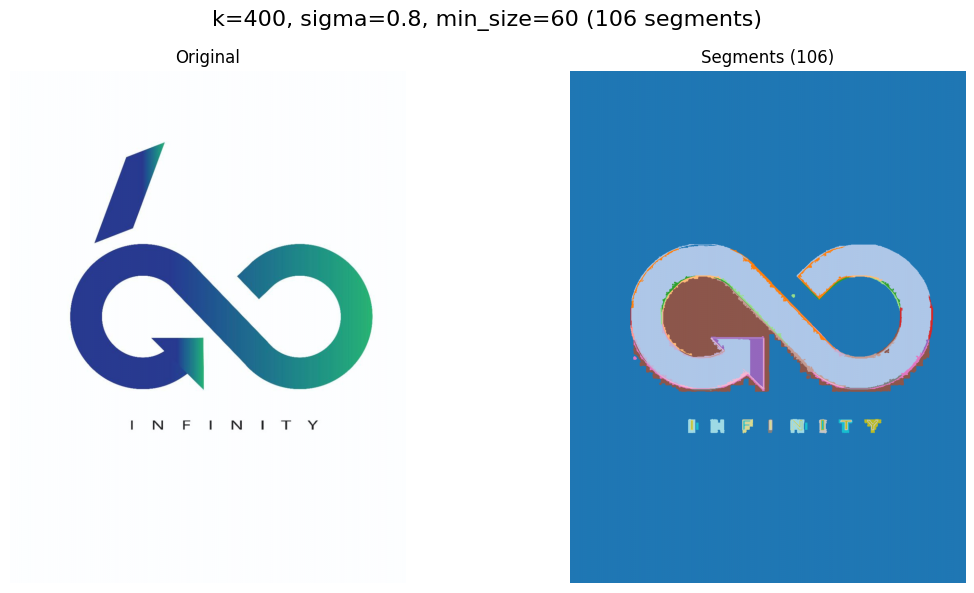


[3/3] Testing: {'k': 600, 'min_size': 100, 'sigma': 1.0}
Felzenszwalb-Huttenlocher segmentation
Initial params: k=600, min_size=100, sigma=1.0


/tmp/ipython-input-3885346643.py:33: UserWarning: Image appears normalized to [0,1] (max=1.0). Provided k=600 is large; rescaling to 2.3529. If you intended k for 0-255 images, pass scaled value.
  warnings.warn(


UnionFind initialized with 1265920 elements
 Progress: 505687/5056875 (9%)
 Progress: 1011374/5056875 (19%)
 Progress: 1517061/5056875 (29%)
 Progress: 2022748/5056875 (39%)
 Progress: 2528435/5056875 (49%)
 Progress: 3034122/5056875 (59%)
 Progress: 3539809/5056875 (69%)
 Progress: 4045496/5056875 (79%)
 Progress: 4551183/5056875 (89%)
 Progress: 5056870/5056875 (99%)
Initial merges: 1265668
small-component merges: 209
Segmentation complete: 43 segments


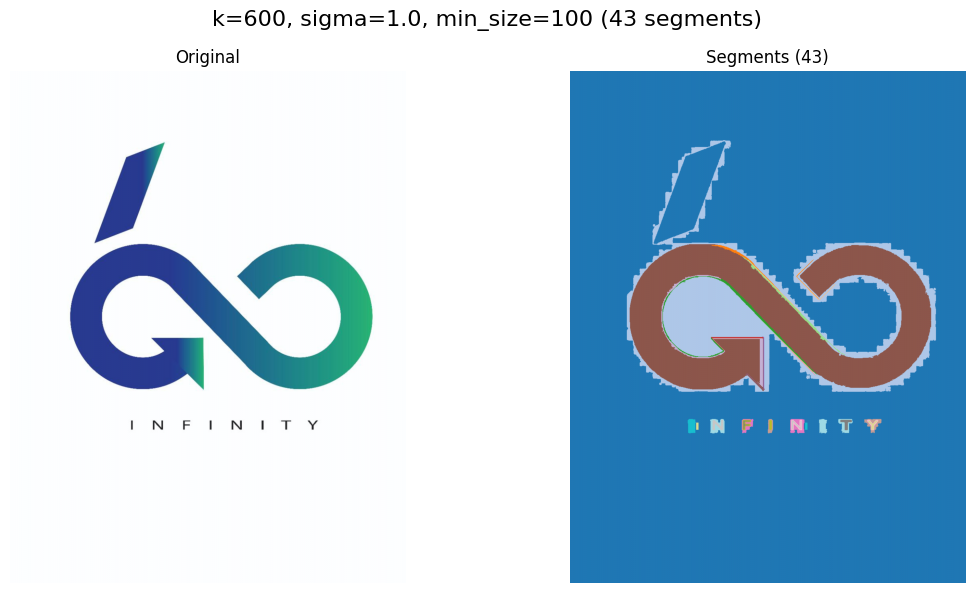


 Comparison complete!


In [66]:
print("EXAMPLE 6: UPLOAD YOUR OWN IMAGE")

img_custom = load_image(source='upload')

# Display original
plt.figure(figsize=(10, 8))
plt.imshow(img_custom)
plt.title("Your Uploaded Image", fontsize=14, fontweight='bold')
plt.axis('off')
plt.show()

# Segment with default parameters
labels_custom, num_seg_custom = felzenszwalb_segmentation(
    img_custom, k=300, min_size=50, sigma=0.8
)

# Visualize
visualize_segmentation(img_custom, labels_custom, "Custom Image Segmentation")


# Compare different parameters on your image
custom_params = [
    {'k': 200, 'min_size': 30, 'sigma': 0.5},
    {'k': 400, 'min_size': 60, 'sigma': 0.8},
    {'k': 600, 'min_size': 100, 'sigma': 1.0},
]

compare_parameters(img_custom, custom_params)


### EXAMPLE 7: LOAD IMAGE FROM URL



 Loading image from: https://imgs.search.brave.com/9j5GTE212oJUQZPfiBB26tngnjz8zHPa_m633ZmN5DM/rs:fit:500:0:1:0/g:ce/aHR0cHM6Ly9pY2hl/Zi5iYmNpLmNvLnVr/L25ld3MvNDgwL2Nw/c3Byb2RwYi9BMjc3/L3Byb2R1Y3Rpb24v/XzEwMDYxOTUxNF82/YWFjYjdmNS04Njhj/LTQ5YmItYThjZS1l/ZmM5MTA1ZDBjNTUu/anBnLndlYnA

Image loaded from URL
   Shape: (375, 500, 3), dtype: float64


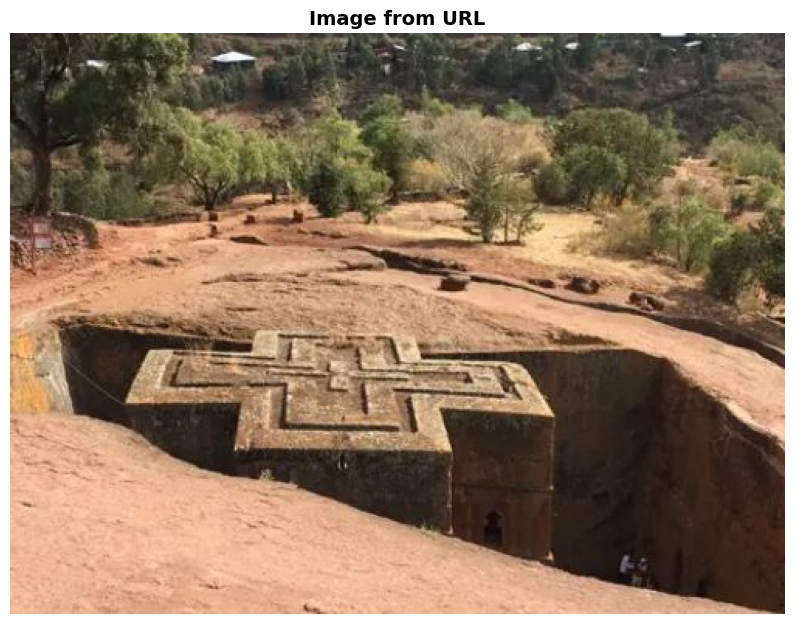

Felzenszwalb-Huttenlocher segmentation
Initial params: k=400, min_size=80, sigma=0.8


/tmp/ipython-input-3885346643.py:33: UserWarning: Image appears normalized to [0,1] (max=1.0). Provided k=400 is large; rescaling to 1.5686. If you intended k for 0-255 images, pass scaled value.
  warnings.warn(


UnionFind initialized with 187500 elements
 Progress: 74737/747377 (9%)
 Progress: 149474/747377 (19%)
 Progress: 224211/747377 (29%)
 Progress: 298948/747377 (39%)
 Progress: 373685/747377 (49%)
 Progress: 448422/747377 (59%)
 Progress: 523159/747377 (69%)
 Progress: 597896/747377 (79%)
 Progress: 672633/747377 (89%)
 Progress: 747370/747377 (99%)
Initial merges: 186375
small-component merges: 1009
Segmentation complete: 116 segments


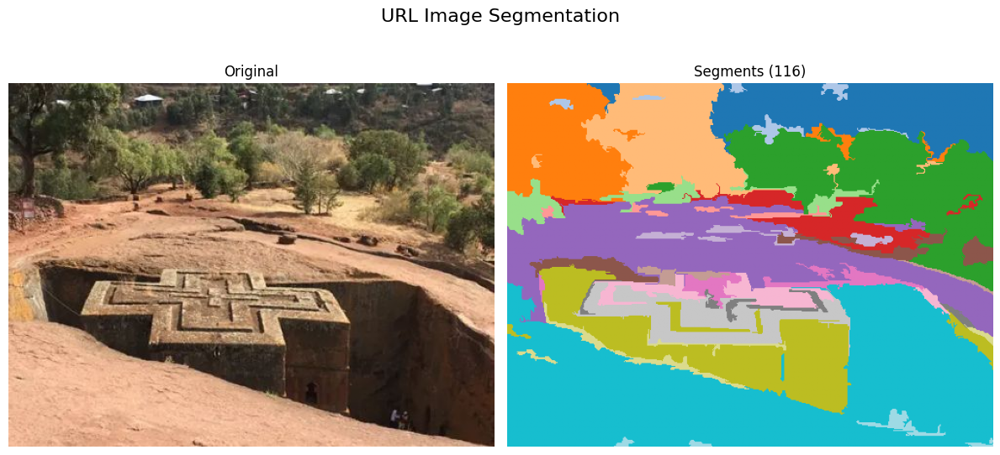

In [65]:
image_url = "https://imgs.search.brave.com/9j5GTE212oJUQZPfiBB26tngnjz8zHPa_m633ZmN5DM/rs:fit:500:0:1:0/g:ce/aHR0cHM6Ly9pY2hl/Zi5iYmNpLmNvLnVr/L25ld3MvNDgwL2Nw/c3Byb2RwYi9BMjc3/L3Byb2R1Y3Rpb24v/XzEwMDYxOTUxNF82/YWFjYjdmNS04Njhj/LTQ5YmItYThjZS1l/ZmM5MTA1ZDBjNTUu/anBnLndlYnA"
# image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/a/a4/Bete_Giyorgis_01.jpg/250px-Bete_Giyorgis_01.jpg"

print(f"\n Loading image from: {image_url}")
img_url = load_image_from_url(url=image_url)

# Display original
plt.figure(figsize=(10, 8))
plt.imshow(img_url)
plt.title("Image from URL", fontsize=14, fontweight='bold')
plt.axis('off')
plt.show()

# Segment
labels_url, num_seg_url = felzenszwalb_segmentation(
    img_url, k=400, min_size=80, sigma=0.8
)

# Visualize
visualize_segmentation(img_url, labels_url, "URL Image Segmentation")

### It implemented this paper: https://cs.brown.edu/people/pfelzens/papers/seg-ijcv.pdf